In [ ]:
# This is the starter file of the project! 

In [1]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd
import cvxpy as cvx

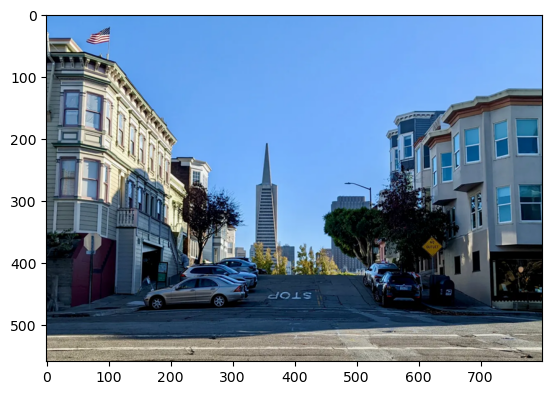

In [20]:
im=plt.imread('sfo.png')
plt.imshow(im)

In [22]:
im.shape
im[200,400,2]

0.9843137

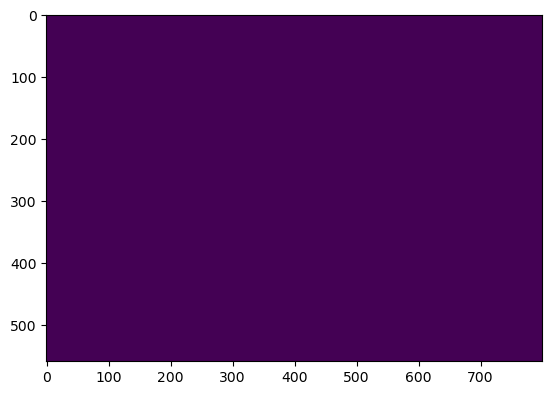

In [4]:
plt.imshow(im[:,:,3])

In [5]:
im3=im[:,:,:3]

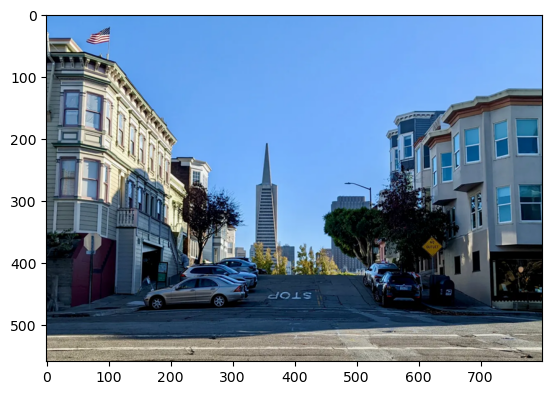

In [6]:
plt.imshow(im3)

In [12]:
im2=im3[:,:,1].copy()

In [13]:
im2.shape

(559, 800)

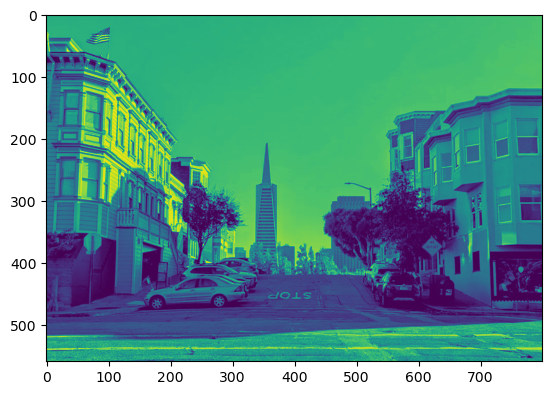

In [14]:
plt.imshow(im2)

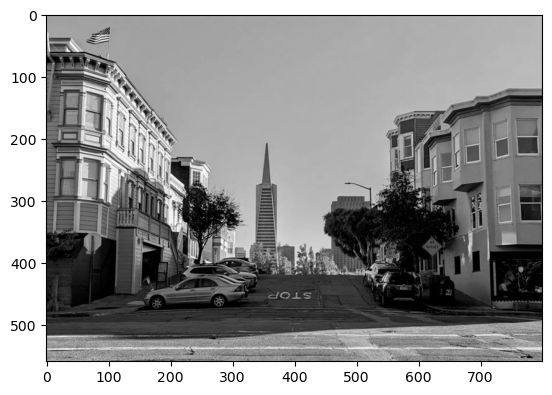

In [16]:
plt.imshow(im2,cmap='gray')

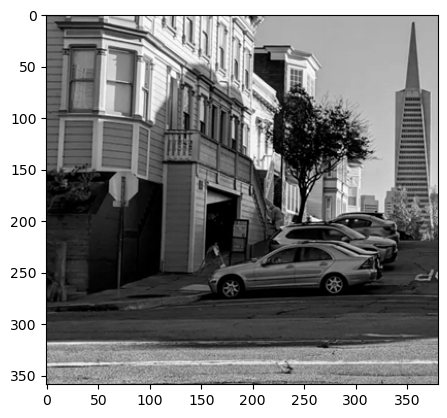

In [17]:
plt.imshow(im2[200:,:380],cmap=plt.cm.gray)

In [19]:
im2[3,200] 


0.6313726

In [25]:
U,s,Vh=sp.linalg.svd(im2,full_matrices=False)

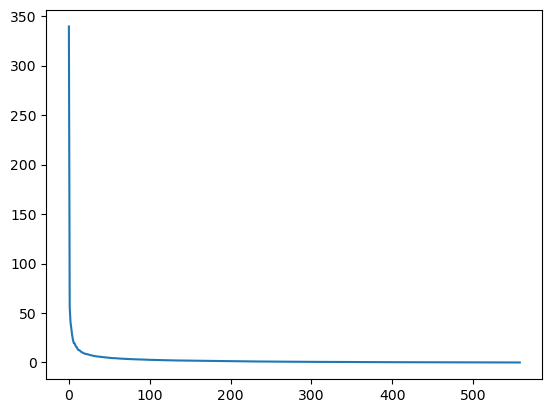

In [26]:
plt.plot(s)

([<matplotlib.lines.Line2D at 0x1fc633177a0>], None)

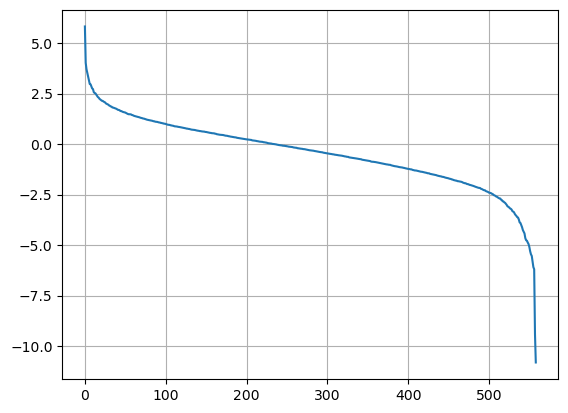

In [27]:
plt.plot(np.log(s)),plt.grid()

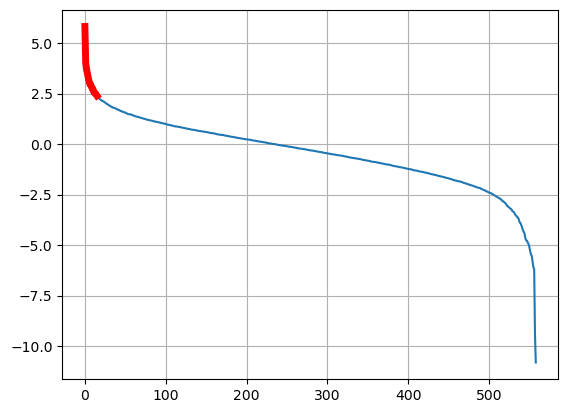

In [30]:
plt.plot(np.log(s))
plt.plot(np.log(s[:16]),'r-',lw=5)
plt.grid()

In [32]:
S=s.copy()
S[16:]=0
S

array([339.60327 ,  56.09537 ,  40.82116 ,  33.85452 ,  27.744326,
        23.093285,  19.688538,  19.424503,  17.435345,  15.757174,
        15.280232,  13.131327,  12.586622,  12.402197,  11.626677,
        10.953339,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.      ,
         0.      ,   0.      ,   0.      ,   0.      ,   0.   

In [33]:
S=np.diag(S)
S

array([[339.60327,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,  56.09537,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,   0.     ,  40.82116, ...,   0.     ,   0.     ,
          0.     ],
       ...,
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ],
       [  0.     ,   0.     ,   0.     , ...,   0.     ,   0.     ,
          0.     ]], dtype=float32)

In [40]:
imReconstructed=U@S@Vh

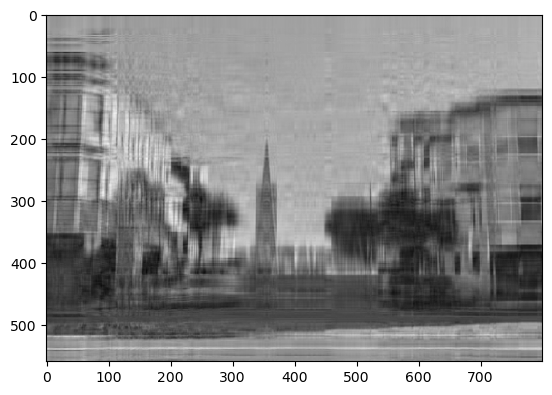

In [41]:
plt.imshow(imReconstructed,cmap='gray')

In [42]:
CR=(im2.shape[0]+im2.shape[1])*16/(im2.shape[0]*im2.shape[1])
CR

0.048622540250447224

In [54]:
r=[16,30,70,100,200,250]   
# length of the S vector to be kept.

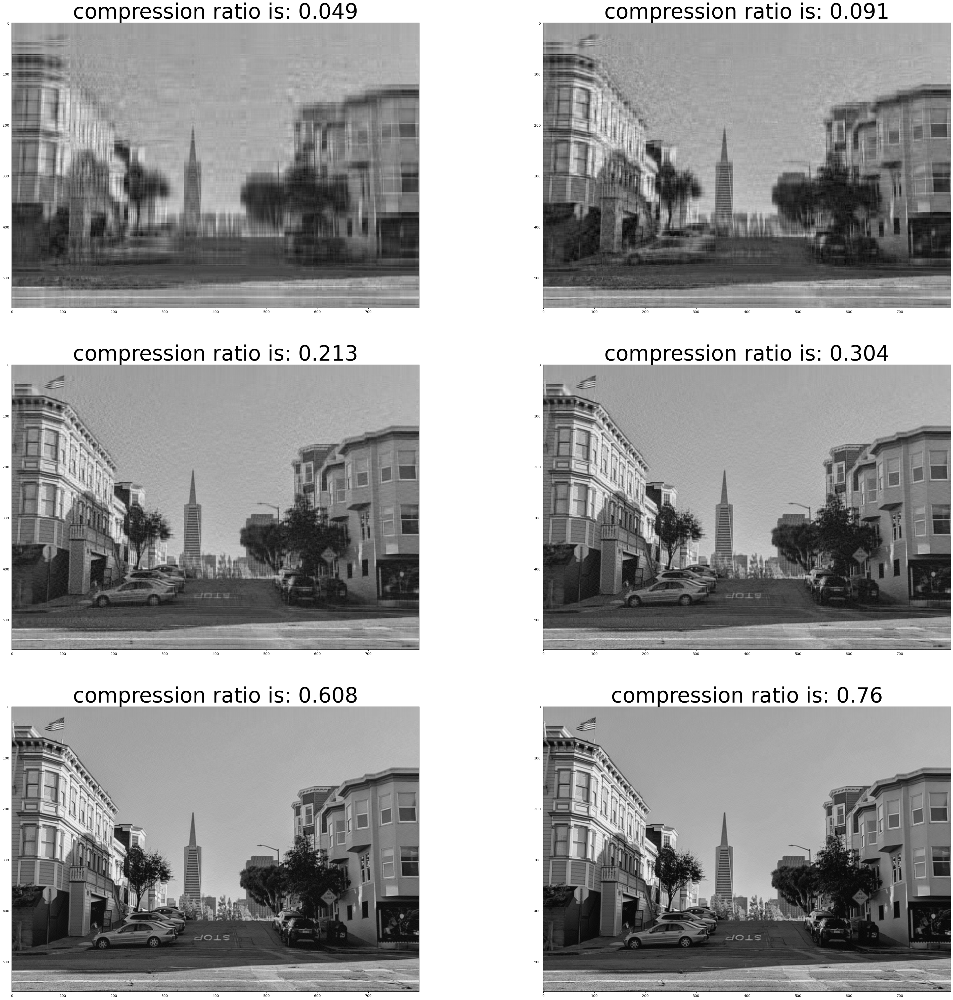

In [70]:
plt.figure(figsize=(50,50))
for i in range(len(r)):
    S=s.copy()
    S[r[i]:]=0
    S=np.diag(S)
    imReconstructed=U@S@Vh
    plt.subplot(321+i)
    plt.imshow(imReconstructed,cmap='gray')
    CR=(im2.shape[0]+im2.shape[1])*r[i]/(im2.shape[0]*im2.shape[1])
    plt.title(f'compression ratio is: {np.round(CR,3)}',fontsize=60)


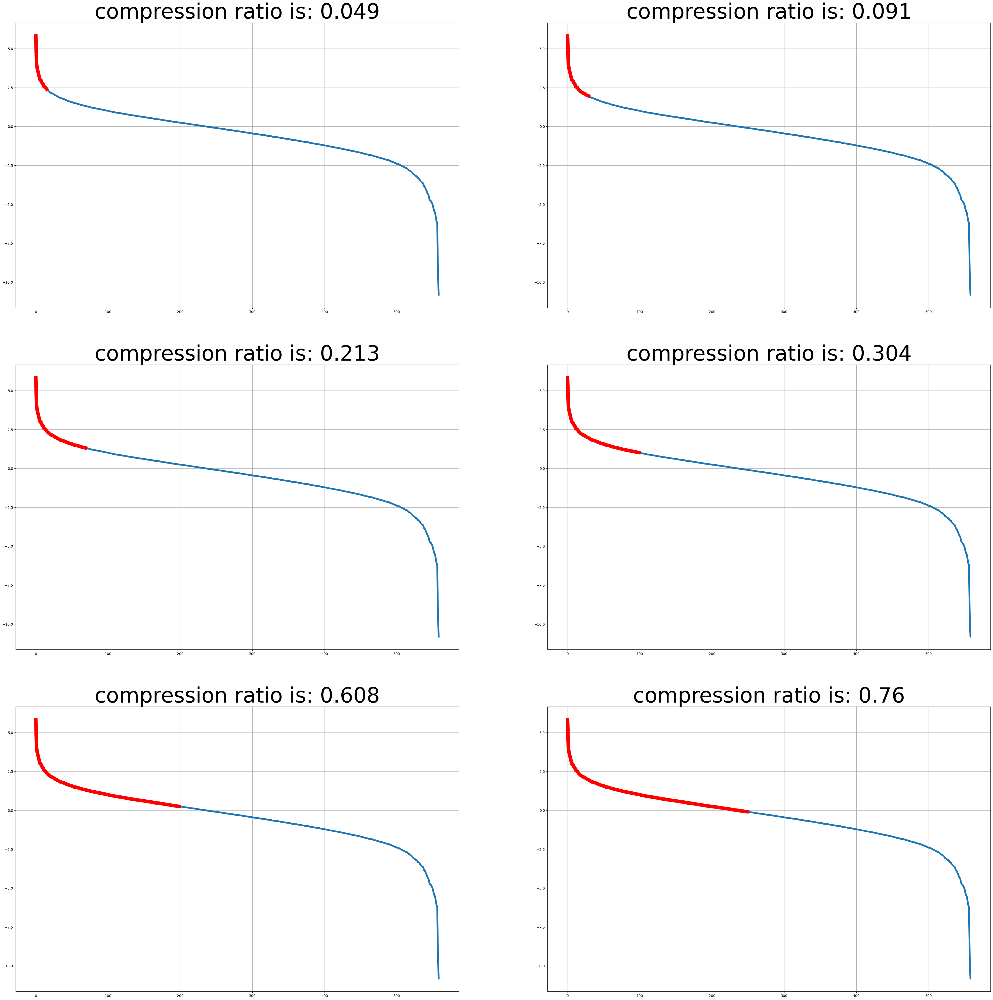

In [72]:
plt.figure(figsize=(50,50))
for i in range(len(r)):
    S=s.copy()
    plt.subplot(321+i)
    CR=(im2.shape[0]+im2.shape[1])*r[i]/(im2.shape[0]*im2.shape[1])
    plt.title(f'compression ratio is: {np.round(CR,3)}',fontsize=60)
    plt.grid()
    plt.plot(np.log(s),lw=5)
    plt.plot(np.log(s[:r[i]]),'r-',lw=10)

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import cvxpy as cvx


# Question 1: -3x+y<=6, x+2y <=4, -y<=3, maximize x-4y¶

In [3]:
A=np.array([-3,1,1,2,0,-1]).reshape(3,2)
A

array([[-3,  1],
       [ 1,  2],
       [ 0, -1]])

In [4]:
b=np.array([6,4,3])
c=np.array([1,-4])
bounds=np.array([None]*4).reshape(2,2)
bounds

array([[None, None],
       [None, None]], dtype=object)

In [5]:
ans=sp.optimize.linprog(-c,A,b,bounds=bounds)

In [6]:
ans.x

array([10., -3.])

In [8]:
-ans.fun

22.0

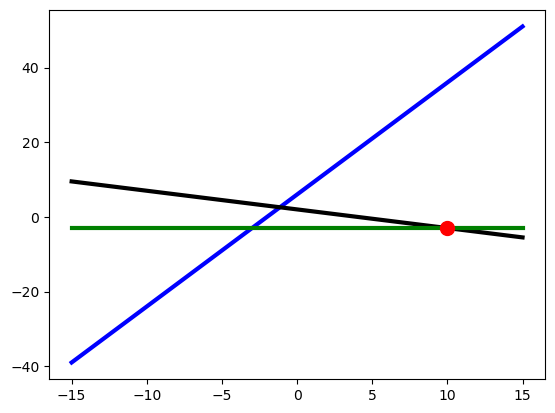

In [10]:
x=np.linspace(-15,15,400)
plt.plot(x,3*x+6,'b-',lw=3)
plt.plot(x,-0.5*x+2,'k-',lw=3)
plt.plot(x,-3*np.ones(len(x)),'g-',lw=3)
plt.plot(ans.x[0],ans.x[1],'ro',markersize=10)

# Question 1: -3x+y<=6, x+2y <=4, -y<=3, maximize x-4y
# Question 2: x is 70, y is 50, z is 60 each piece. for max money
# 2x+4y+3z<=150, 3x+y+5z<=160, 7x+3y+5z<=200, x,y,z>=0

In [13]:
A=np.array([2,4,3,3,1,5,7,3,5]).reshape(3,3)
A

array([[2, 4, 3],
       [3, 1, 5],
       [7, 3, 5]])

In [14]:
b=np.array([150,160,200])

In [15]:
c=np.array([70,50,60])

In [16]:
ans=sp.optimize.linprog(-c,A,b)

In [17]:
ans.x

array([ 2.12121212, 15.75757576, 27.57575758])

In [18]:
c.dot(ans.x)

2590.909090909091

In [19]:
ans.fun

-2590.909090909091

In [20]:
X1=[2,15,27]
X2=[3,15,27]
X3=[2,16,27]
X4=[2,15,28]
A@X1,A@X2,A@X3,A@X4

(array([145, 156, 194]),
 array([147, 159, 201]),
 array([149, 157, 197]),
 array([148, 161, 199]))

In [21]:
c.dot(X1),c.dot(X3)

(2510, 2560)

In [23]:
X=X3
profit=c.dot(X)

In [24]:
print(f'The volumes of the products should be: {X}')
print(f'The profit is {profit}')

The volumes of the products should be: [2, 16, 27]
The profit is 2560


In [25]:
X1=[15,29,0]
X2=[16,29,0]
X3=[15,30,0]
X4=[15,29,1]
A@X1,A@X2,A@X3,A@X4

(array([146,  74, 192]),
 array([148,  77, 199]),
 array([150,  75, 195]),
 array([149,  79, 197]))

In [26]:
c.dot(X1),c.dot(X2),c.dot(X3),c.dot(X4)

(2500, 2570, 2550, 2560)

In [27]:
X=X2
profit=c.dot(X)
print(f'The volumes of the products should be: {X}')
print(f'The profit is {profit}')

The volumes of the products should be: [16, 29, 0]
The profit is 2570


In [29]:
import cvxpy as cvx

In [31]:
X=cvx.Variable(3,integer=True)

In [34]:
X[1]

Expression(AFFINE, UNKNOWN, ())

In [40]:
obj=cvx.Maximize(c@X)
cons=[2*X[0]+4*X[1]+3*X[2]<=150,
      3*X[0]+X[1]+5*X[2]<=160,
      7*X[0]+3*X[1]+5*X[2]<=200,
      X>=0]

cons1=[(A@X)[i]<=b[i] for i in range(3)]+[X>=0]

In [43]:
problem=cvx.Problem(obj,cons1)

In [44]:
problem.solve()

2570.0

In [45]:
X.value

array([16., 29., -0.])

Text(0.5, 1.0, 'Question 3')

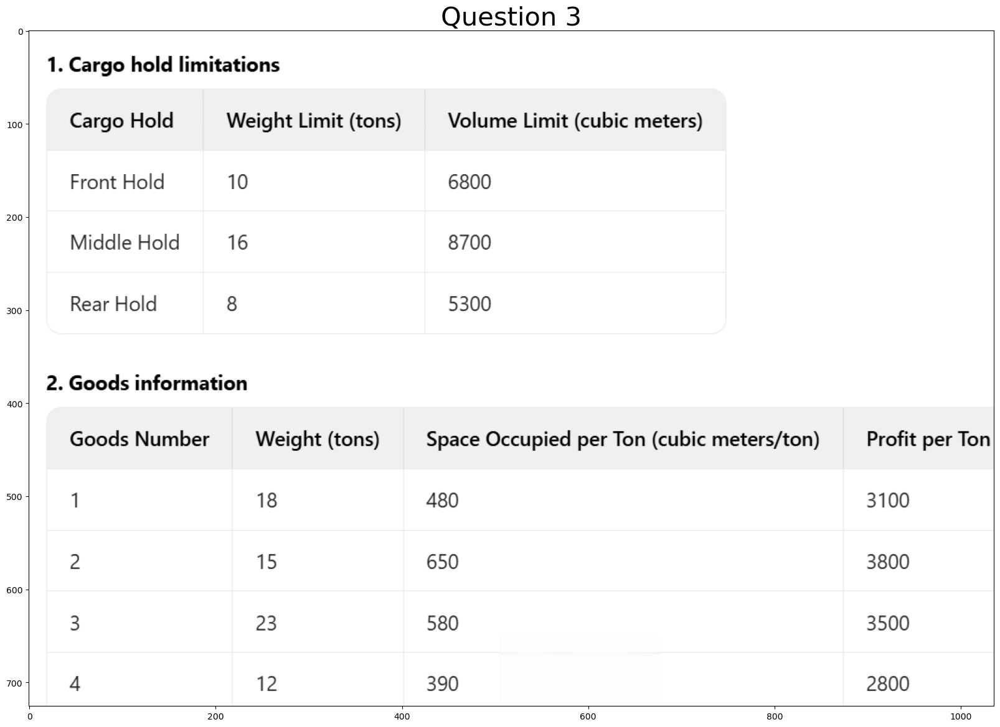

In [73]:
plt.figure(figsize=(20,20))
plt.imshow(plt.imread('linearP.png'))
plt.title('Question 3', fontsize=30)

In [48]:
a=np.array([1,0,0]*4)

In [49]:
a

array([1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0])

In [50]:
A1=np.vstack((a,np.roll(a,1),np.roll(a,2)))
A1

array([[1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0],
       [0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0],
       [0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1]])

In [53]:
weightPlane=np.array([10,16,8])
weightProducts=np.array([18,15,23,12])
volumePlane=np.array([6800,8700,5300])
specificVolume=np.array([480,650,580,390])
price=np.array([3100,3800,3500,2800])

In [52]:
A2=A1.copy()

In [54]:
A2=A2*np.repeat(specificVolume,3)
A2

array([[480,   0,   0, 650,   0,   0, 580,   0,   0, 390,   0,   0],
       [  0, 480,   0,   0, 650,   0,   0, 580,   0,   0, 390,   0],
       [  0,   0, 480,   0,   0, 650,   0,   0, 580,   0,   0, 390]])

In [55]:
a=np.zeros(12)
a[:3]=1
a

array([1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [57]:
A3=np.vstack((a,np.roll(a,3),np.roll(a,6),np.roll(a,9)))
A3

array([[1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 1., 1., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1.]])

In [58]:
A=np.vstack((A1,A2,A3))
A

array([[  1.,   0.,   0.,   1.,   0.,   0.,   1.,   0.,   0.,   1.,   0.,
          0.],
       [  0.,   1.,   0.,   0.,   1.,   0.,   0.,   1.,   0.,   0.,   1.,
          0.],
       [  0.,   0.,   1.,   0.,   0.,   1.,   0.,   0.,   1.,   0.,   0.,
          1.],
       [480.,   0.,   0., 650.,   0.,   0., 580.,   0.,   0., 390.,   0.,
          0.],
       [  0., 480.,   0.,   0., 650.,   0.,   0., 580.,   0.,   0., 390.,
          0.],
       [  0.,   0., 480.,   0.,   0., 650.,   0.,   0., 580.,   0.,   0.,
        390.],
       [  1.,   1.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.],
       [  0.,   0.,   0.,   1.,   1.,   1.,   0.,   0.,   0.,   0.,   0.,
          0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   1.,   1.,   1.,   0.,   0.,
          0.],
       [  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   1.,
          1.]])

In [59]:
b=np.hstack((weightPlane,volumePlane,weightProducts))
'''weightPlane=np.array([10,16,8])
weightProducts=np.array([18,15,23,12])
volumePlane=np.array([6800,8700,5300]) '''

'weightPlane=np.array([10,16,8])\nweightProducts=np.array([18,15,23,12])\nvolumePlane=np.array([6800,8700,5300]) '

In [60]:
b

array([  10,   16,    8, 6800, 8700, 5300,   18,   15,   23,   12])

In [61]:
c=np.repeat(price,3)
c

array([3100, 3100, 3100, 3800, 3800, 3800, 3500, 3500, 3500, 2800, 2800,
       2800])

In [62]:
ans=sp.optimize.linprog(-c,A,b)

In [63]:
ans.x

array([ 0.        ,  0.        ,  0.        , 10.        ,  0.        ,
        5.        ,  0.        , 12.94736842,  3.        ,  0.        ,
        3.05263158,  0.        ])

In [64]:
-ans.fun

121363.15789473493

In [65]:
import pandas as pd

In [67]:
loadingPlan=pd.DataFrame(ans.x.reshape(4,3))

In [68]:
loadingPlan.columns=['front','middle','rear']
loadingPlan.index=['p1','p2','p3','p4']

In [69]:
loadingPlan

,front,middle,rear
p1,0.0,0.000000,0.0
p2,10.0,0.000000,5.0
p3,0.0,12.947368,3.0
p4,0.0,3.052632,0.0
